In [2]:
import claudio
import librosa
import matplotlib.pyplot as plt
import mir_eval
import numpy as np
import os
import pandas
import scipy.signal as sig
import IPython.display as display
import subprocess

%matplotlib inline

import seaborn
import mpld3

seaborn.set()
np.set_printoptions(precision=4, suppress=True)
mpld3.enable_notebook()

In [3]:
import minst.taxonomy as tax
import minst.sources.uiowa as uiowa
import minst.sources.rwc as rwc
import minst.segment as S

In [4]:
res = uiowa.collect("/Volumes/SHUTTLE/uiowa", fext='*.ogg')
res[res.instrument == 'BbClar'][:25]

/usr/local/opt/miniconda3/envs/py35/lib/python3.5/site-packages/IPython/core/formatters.py:92: DeprecationWarning: DisplayFormatter._ipython_display_formatter_default is deprecated: use @default decorator instead.
  def _ipython_display_formatter_default(self):
/usr/local/opt/miniconda3/envs/py35/lib/python3.5/site-packages/IPython/core/formatters.py:669: DeprecationWarning: PlainTextFormatter._singleton_printers_default is deprecated: use @default decorator instead.
  def _singleton_printers_default(self):


,audio_file,dataset,dynamic,instrument,note
uiowa43d4c6fa,/Volumes/SHUTTLE/uiowa/theremin.music.uiowa.ed...,uiowa,mf,BbClar,C6B6
uiowae7384132,/Volumes/SHUTTLE/uiowa/theremin.music.uiowa.ed...,uiowa,pp,BbClar,C5B5
uiowa16a92810,/Volumes/SHUTTLE/uiowa/theremin.music.uiowa.ed...,uiowa,ff,BbClar,C4B4
uiowa2beaa7ef,/Volumes/SHUTTLE/uiowa/theremin.music.uiowa.ed...,uiowa,ff,BbClar,C5B5
uiowae2fa7b15,/Volumes/SHUTTLE/uiowa/theremin.music.uiowa.ed...,uiowa,pp,BbClar,C4B4
uiowa2b31feb1,/Volumes/SHUTTLE/uiowa/theremin.music.uiowa.ed...,uiowa,mf,BbClar,C4B4
uiowab86004a8,/Volumes/SHUTTLE/uiowa/theremin.music.uiowa.ed...,uiowa,ff,BbClar,C6B6
uiowa5186668b,/Volumes/SHUTTLE/uiowa/theremin.music.uiowa.ed...,uiowa,None,BbClar,None
uiowa9332c8de,/Volumes/SHUTTLE/uiowa/theremin.music.uiowa.ed...,uiowa,pp,BbClar,C6B6
uiowae9a36605,/Volumes/SHUTTLE/uiowa/theremin.music.uiowa.ed...,uiowa,ff,BbClar,D3B3


In [26]:
res = rwc.collect("minst/tests/dummy_rwc/")

In [72]:
res

,audio_file,dataset,dynamic,instrument,note
uiowaf22b2666,minst/tests/dummy_uiowa/theremin.music.uiowa.e...,uiowa,pp,Tuba,C2B2


In [123]:
x, fs = claudio.read(res.iloc[0].audio_file, samplerate=22050, 
                     channels=1, bytedepth=2)

In [215]:
filename = res.loc['uiowa880e2815'].audio_file
x, fs = claudio.read(filename, 
                     samplerate=22050, channels=1, bytedepth=2)
time_range = np.arange(len(x)) / fs
display.Audio(data=x.flatten(), rate=fs)

In [216]:
x.shape

(1319989, 1)

In [217]:
log_env = 10*np.log10(10.**-4.5 + np.power(x.flatten()[:], 2.0))

In [218]:
w_n = np.hanning(100)
w_n /= w_n.sum()
log_env_lpf = sig.filtfilt(w_n, np.ones(1), log_env)

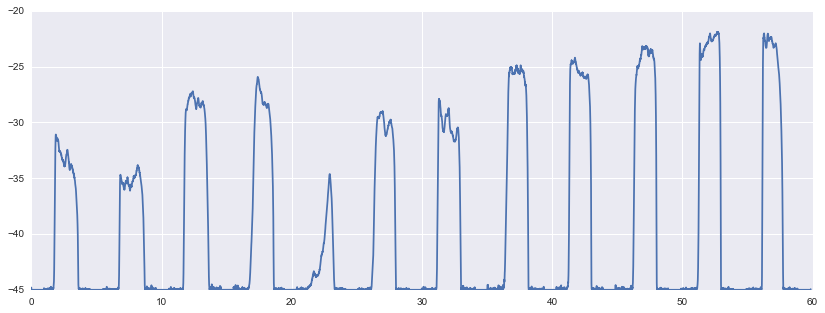

In [219]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(14, 5))
n_hop = 100
ax.plot(time_range[::n_hop], log_env_lpf[::n_hop])

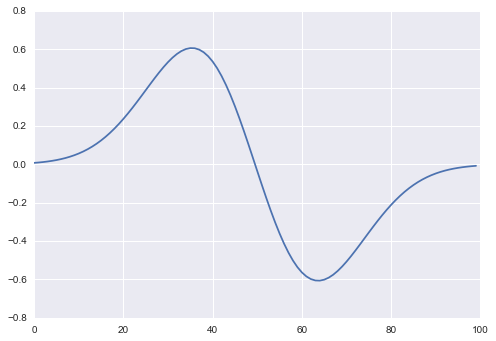

In [18]:
plt.plot(canny(100, 3.5, 1))

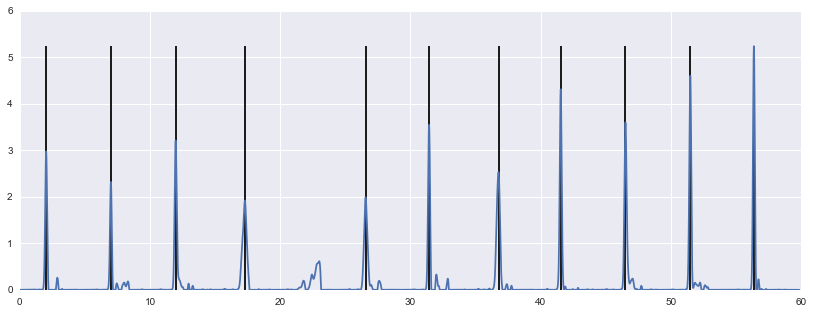

In [221]:
kernel = canny(100, 3.5, 1)
kernel /= 2*np.abs(kernel).sum()
onsets_forward = sig.lfilter(kernel, np.ones(1), log_env_lpf[::n_hop] - log_env_lpf.min(), axis=0)
onsets_lenv = sig.lfilter(-kernel, np.ones(1), onsets_forward[::-1], axis=0)[::-1]
onsets_pos = onsets_forward * (onsets_forward>0)
onsets_neg = onsets_forward - onsets_neg
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(14, 5))
ax.plot(time_range[::n_hop], )
peak_idx = librosa.util.peak_pick(onsets_forward * (onsets_forward>0),
                                  500, 500, 10, 10, 0.025, 5)
peak_times = librosa.frames_to_time(peak_idx, hop_length=n_hop)
ax.vlines(peak_times, ymin=0, ymax=onsets_forward.max())

In [252]:
lcqt.shape

(192, 1290)

In [223]:
librosa.onset.onset_detect(x.flatten(), sr=fs)

array([  43,   53,   72,   80,  118,  128,  137,  155,  161,  238,  281,
        285,  295,  311,  329,  334,  381,  396,  413,  456,  487,  500,
        548,  555,  583,  588,  594,  601,  628,  670,  682,  704,  715,
        743,  784,  790,  807,  829,  880,  883,  889,  903,  911,  983,
       1010, 1025, 1082, 1105, 1125, 1155, 1188, 1210, 1242, 1250, 1293,
       1306, 1333, 1339, 1358, 1410, 1429, 1469, 1510, 1549, 1559, 1613,
       1653, 1660, 1686, 1692, 1696, 1738, 1749, 1770, 1773, 1782, 1795,
       1832, 1874, 1890, 1892, 1934, 1943, 1977, 1987, 2056, 2150, 2191,
       2212, 2243, 2258, 2281, 2366, 2371, 2415, 2420, 2424, 2453, 2488,
       2492])

In [212]:
librosa.util.peak_pick?

<Container object of 25 artists>

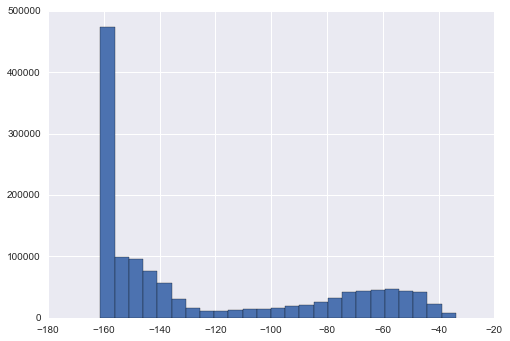

In [52]:
bins, edges = np.histogram(10*np.log(10.**-7 + np.power(x.flatten()[:], 2.0)), bins=25)
plt.bar(edges[:-1], bins, width=np.abs(np.diff(edges))[0])

In [249]:
hop_length = 1024
x_noise = x + np.random.normal(scale=10.**-3, size=x.shape)
cqt = librosa.cqt(x_noise.flatten(), 
                  sr=fs, hop_length=hop_length, fmin=27.5,
                  n_bins=24*8, bins_per_octave=24, tuning=0, sparsity=0,
                  real=False, norm=1)
cqt = np.abs(cqt)

In [277]:
# lcqt = cqt - np.median(cqt, axis=1, keepdims=True)
# lcqt /= np.std(cqt, axis=1, keepdims=True)
lcqt = np.log1p(5000*cqt)

In [203]:
lcqt = librosa.logamplitude(np.power(cqt - np.median(cqt, axis=1, keepdims=True), 2.0),
                            ref_power=np.max, top_db=65)

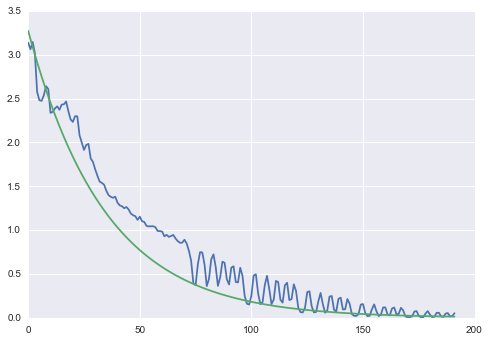

In [285]:
plt.plot(np.median(lcqt, axis=1))
plt.plot(90. / librosa.cqt_frequencies(192, 27.5, 24, 0))

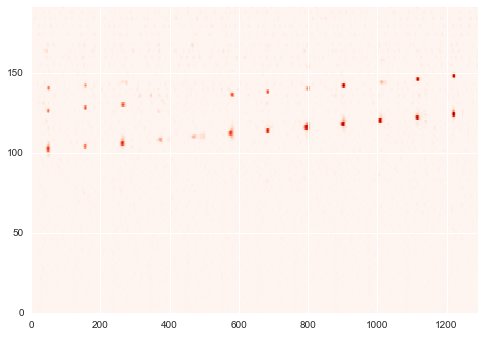

In [311]:
weights = (90. / librosa.cqt_frequencies(192, 27.5, 24, 0)).reshape(-1, 1)
lcqt2 = lcqt / weights
lcqt2 -= lcqt2.mean(axis=1, keepdims=True)
oset = sig.lfilter(canny(25, 3.5, 1), np.ones(1), lcqt2)
plt.imshow(oset * (oset > 0), 
           interpolation='nearest', aspect='auto', 
           origin='lower', cmap=plt.cm.Reds)

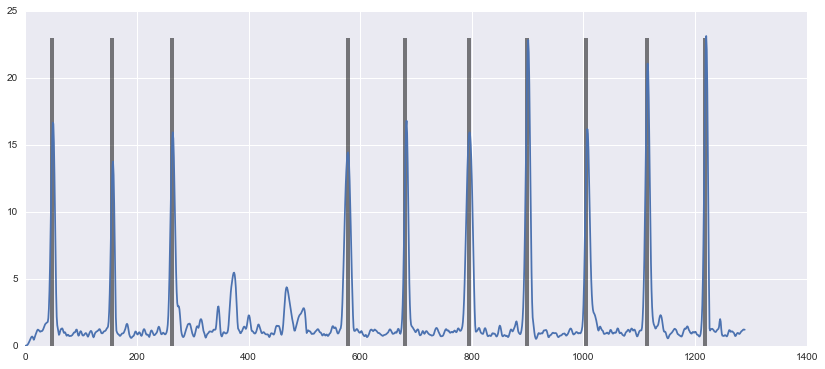

In [329]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(14, 6))
nov_curve = (oset * (oset > 0)).std(axis=0)
ax.plot(nov_curve)
idx = librosa.onset.onset_detect(onset_envelope=nov_curve, delta=0.05, wait=50)
ax.vlines(idx, ymin=0, ymax=23, 
           alpha=0.5, linewidth=4)

In [326]:
nov_curve[idx]

array([ 0.5818,  0.5238,  0.6055,  0.6243,  0.6321,  0.6607,  0.7517,
        0.6024,  0.7787,  0.8289])

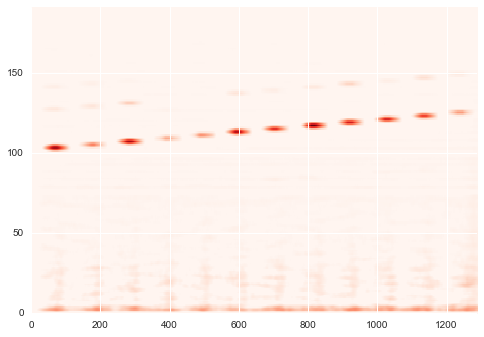

In [276]:
note_on = np.zeros([15, 75])
note_on[7:10, 25:] = 10.0
note_on -= note_on.mean()
enhance = sig.convolve2d(lcqt, note_on, mode='same')
plt.imshow(enhance * (enhance > 0), 
           interpolation='nearest', aspect='auto', 
           origin='lower', cmap=plt.cm.Reds)

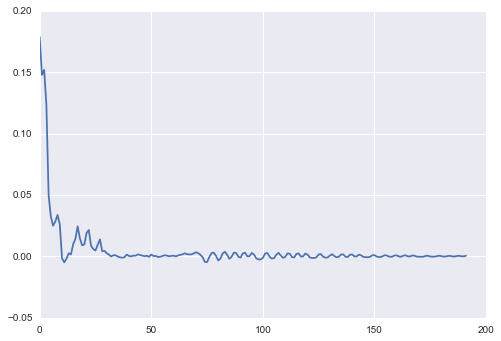

In [261]:
plt.plot(np.median(lcqt - lcqt_mf, axis=1))

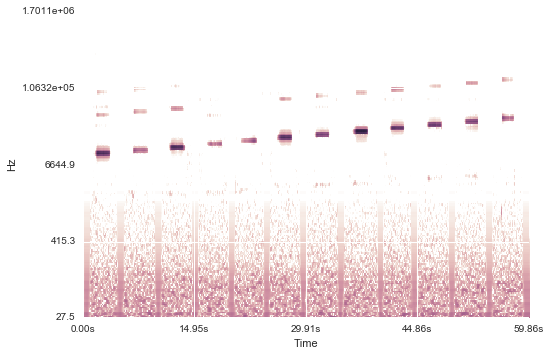

In [206]:
librosa.display.specshow(lcqt, fmin=27.5, hop_length=hop_length,
                         y_axis='cqt_hz', x_axis='time')

In [21]:
time_points = librosa.frames_to_time(np.arange(cqt.shape[1]), sr=fs, 
                                     hop_length=hop_length)

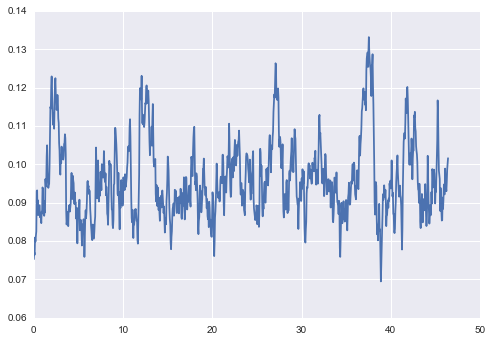

In [22]:
tlen = 1000
env = lcqt.mean(axis=0)
plt.plot(time_points[:tlen], env[:tlen])

In [132]:
bins, edges = np.histogram(np.minimum(env, env.mean()*np.ones_like(env)), 
                           bins=25, range=(0, env.mean()))

<Container object of 25 artists>

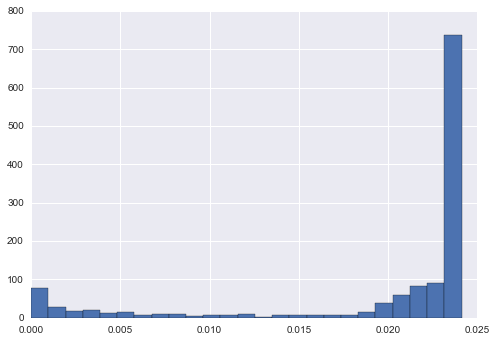

In [133]:
plt.bar(edges[:-1], bins, width=np.abs(np.diff(edges))[0])

In [6]:
def canny(alpha, beta, sig=2.0):
    n = np.linspace(-beta, beta, alpha)
    kernel = (-n / np.power(sig, 2.)) * np.exp(-(n ** 2.0) / (2.0 * (sig ** 2.0)))
    return kernel

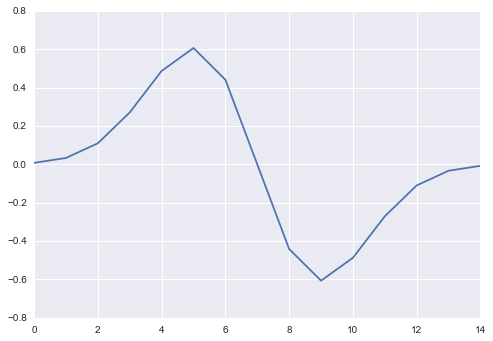

In [17]:
plt.plot(canny(15, 3.5, 1))

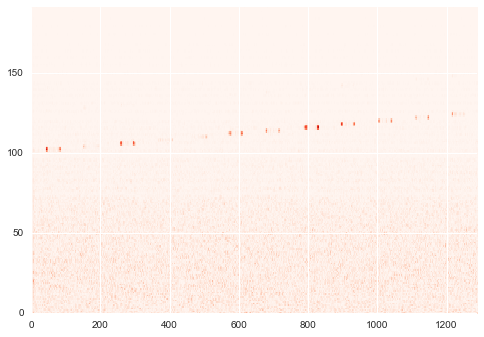

In [36]:
cfilt = canny(15, 5, 1)
onset_lcqt = sig.lfilter(cfilt, np.ones(1), lcqt, axis=1)
plt.imshow(np.abs(onset_lcqt), interpolation='nearest', aspect='auto', 
           origin='lower', cmap=plt.cm.Reds)

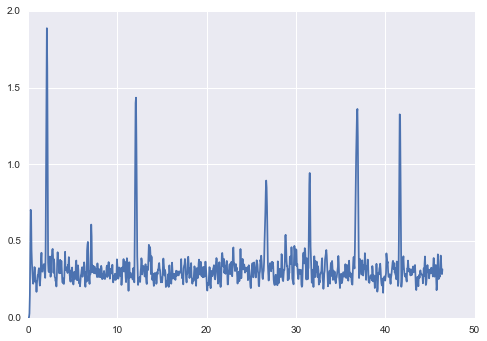

In [37]:
tlen = 1000
# env2 = onset_lcqt.mean(axis=0)
env2 = np.max(onset_lcqt, axis=0)
plt.plot(time_points[:tlen], env2[:tlen])

In [27]:
lr_onset = librosa.onset.onset_strength(S=lcqt, aggregate=np.median)

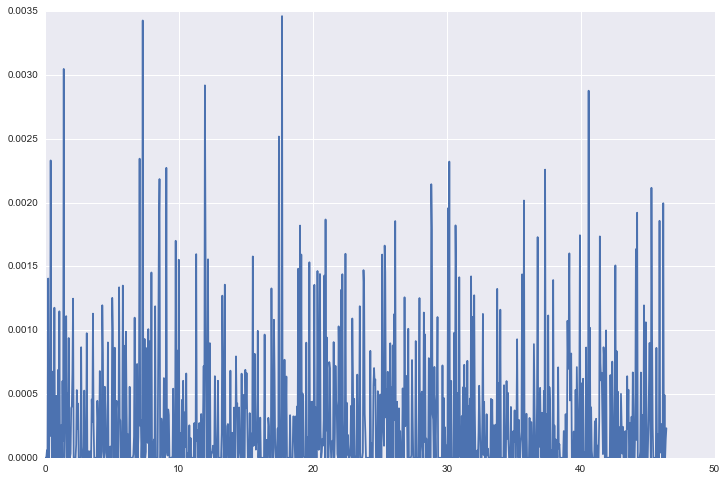

In [28]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(12, 8))
axes.plot(time_points[:tlen], lr_onset[:tlen])
# axes[1].plot(time_points[:tlen], env2[:tlen] * (env2[:tlen] > 0))

In [94]:
fs

22050.0

In [140]:
onset_idxs = librosa.onset.onset_detect(onset_envelope=lr_onset)

In [149]:
start_times = librosa.frames_to_time(onset_idxs, hop_length=hop_length)

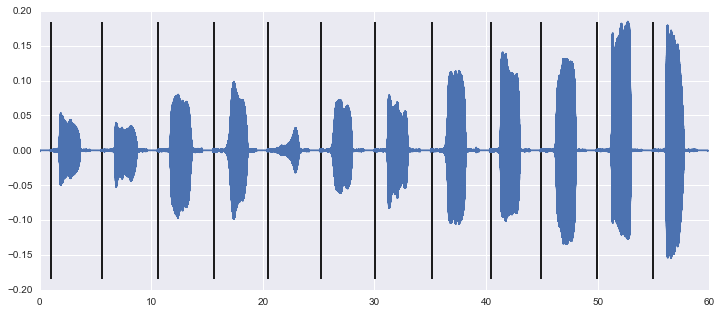

In [152]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(12, 5))
trange = np.arange(len(x)) / fs
nhop = 1
axes.plot(trange[::nhop], x.flatten()[::nhop])
max_val = np.abs(x).max()
axes.vlines(start_times, ymax=max_val, ymin=-max_val, colors='black')
display.Audio(data=x.flatten(), rate=fs)

In [224]:
librosa.util.peak_pick?

In [242]:
def segment_one(filename):
    x, fs = claudio.read(filename, samplerate=22050, 
                         channels=1, bytedepth=2)
    time_range = np.arange(len(x)) / fs
    
    log_env = 10*np.log10(10.**-4.5 + np.power(x.flatten()[:], 2.0))
    w_n = np.hanning(100)
    w_n /= w_n.sum()
    log_env_lpf = sig.filtfilt(w_n, np.ones(1), log_env)
    
    n_hop = 100
    kernel = canny(100, 3.5, 1)
    kernel /= np.abs(kernel).sum()
    onsets_forward = sig.lfilter(kernel, np.ones(1), log_env_lpf[::n_hop] - log_env_lpf.min(), axis=0)
    onsets_lenv = sig.lfilter(-kernel, np.ones(1), onsets_forward[::-1], axis=0)[::-1]
    onsets_pos = onsets_forward * (onsets_forward>0)
    onsets_neg = onsets_forward - onsets_pos

    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(14, 12))
    axes[0].plot(time_range[::n_hop], x.flatten()[::n_hop])
    peak_idx = librosa.util.peak_pick(onsets_forward * (onsets_forward>0),
                                      pre_max=500, post_max=500, pre_avg=10, 
                                      post_avg=10, delta=0.025, wait=100)
    peak_times = librosa.frames_to_time(peak_idx, hop_length=n_hop)
    axes[1].plot(time_range[::n_hop], log_env_lpf[::n_hop])
    axes[2].plot(time_range[::n_hop], onsets_pos)
    for ax, yvals in zip(axes, [(x.min(), x.max()), (log_env_lpf.min(), 0), (0, onsets_forward.max())]):
        ax.vlines(peak_times, ymin=yvals[0], ymax=yvals[1])
    
    return display.Audio(data=x.flatten(), rate=fs)

/Volumes/camel/instruments/uiowa/theremin.music.uiowa.edu/sound files/MIS/Brass/Bbtrumpet/Trumpet.novib.ff.C5B5.aiff


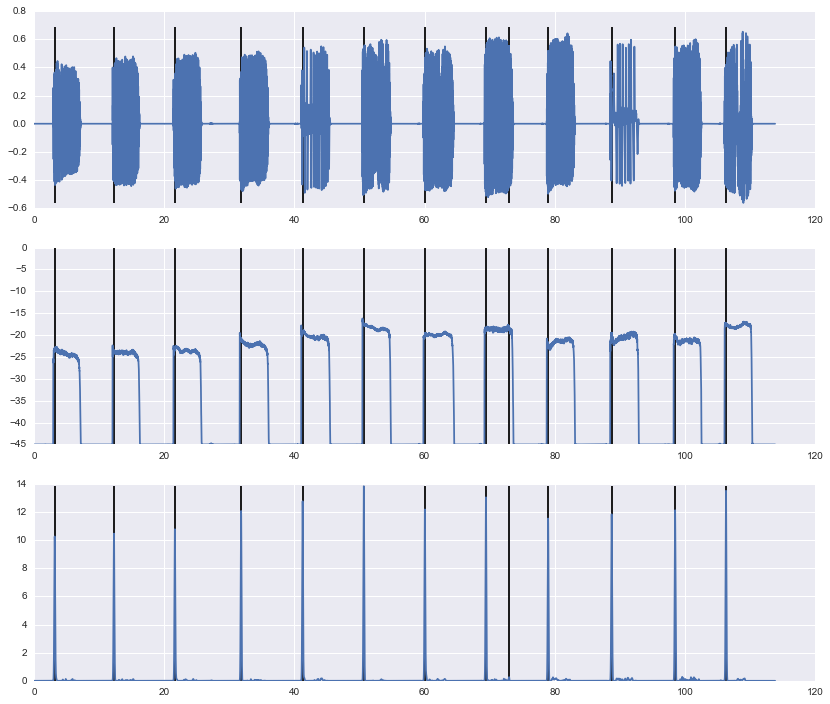

In [247]:
filename = res[res.instrument == "Trumpet"].iloc[1].audio_file
print(filename)
segment_one(filename)

In [337]:
def segment_one(filename):
    x, fs = claudio.read(filename, samplerate=22050, 
                     channels=1, bytedepth=2)
    time_range = np.arange(len(x)) / fs
    
    hop_length = 1024
    x_noise = x + np.random.normal(scale=10.**-3, size=x.shape)
    cqt = librosa.cqt(x_noise.flatten(), 
                      sr=fs, hop_length=hop_length, fmin=27.5,
                      n_bins=24*8, bins_per_octave=24, tuning=0, 
                      sparsity=0, real=False, norm=1)
    cqt = np.abs(cqt)
    lcqt = np.log1p(5000*cqt)
    weights = (96. / librosa.cqt_frequencies(192, 27.5, 24, 0)).reshape(-1, 1)
    lcqt2 = lcqt / weights
    lcqt2 -= lcqt2.mean(axis=1, keepdims=True)
    oset = sig.lfilter(canny(25, 3.5, 1), np.ones(1), lcqt2)
    n_hop = 100
    
    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(14, 12))
    axes[0].plot(time_range[::n_hop], x.flatten()[::n_hop])
    axes[1].imshow(oset * (oset > 0), 
                   interpolation='nearest', aspect='auto', 
                   # (left, right, bottom, top)
                   extent=(0, time_range.max(), 0, 192),
                   origin='lower', cmap=plt.cm.Reds)
    

    nov_curve = (oset * (oset > 0)).std(axis=0)
    axes[2].plot(librosa.frames_to_time(np.arange(len(nov_curve)), 
                                        hop_length=hop_length), 
                 nov_curve)
    peak_idx = librosa.onset.onset_detect(onset_envelope=nov_curve, delta=0.05, wait=50)
    peak_times = librosa.frames_to_time(peak_idx, hop_length=hop_length)
    lims = [(1.2*x.min(), 1.2*x.max()), (0, 192), (nov_curve.min(), nov_curve.max())]
    for ax, yvals in zip(axes, lims):
        ax.vlines(peak_times, ymin=yvals[0], ymax=yvals[1], 
                  alpha=0.5, linewidth=3)
    
#     ax.vlines(idx, ymin=0, ymax=23, 
#                alpha=0.5, linewidth=4)

/Volumes/camel/instruments/uiowa/theremin.music.uiowa.edu/sound files/MIS/Brass/Bbtrumpet/Trumpet.novib.ff.C5B5.aiff


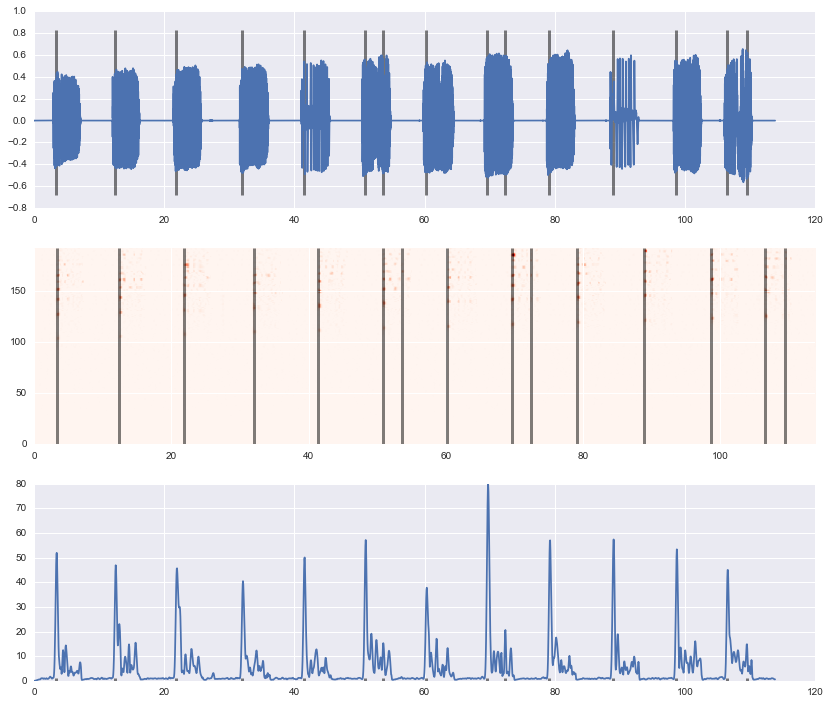

In [338]:
filename = res[res.instrument == "Trumpet"].iloc[1].audio_file
print(filename)
segment_one(filename)

In [11]:
def segment_one(filename, pre_max=0, post_max=1, pre_avg=0, 
                post_avg=1, delta=0.05, wait=50):
    x, fs = claudio.read(filename, samplerate=22050, 
                     channels=1, bytedepth=2)
    time_range = np.arange(len(x)) / fs
    
    hop_length = 1024
    x_noise = x + np.random.normal(scale=10.**-3, size=x.shape)
    cqt = librosa.cqt(x_noise.flatten(), 
                      sr=fs, hop_length=hop_length, fmin=27.5,
                      n_bins=24*8, bins_per_octave=24, tuning=0, 
                      sparsity=0, real=False, norm=1)
    cqt = np.abs(cqt)
    lcqt = np.log1p(5000*cqt)
    return lcqt
    c_n = canny(51, 3.5, 1)
    onset_strength = sig.lfilter(c_n, np.ones(1), lcqt, axis=1).mean(axis=0)
    
    
    n_hop = 100
    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(14, 12))
    axes[0].plot(time_range[::n_hop], x.flatten()[::n_hop])
    axes[1].imshow(lcqt, 
                   interpolation='nearest', aspect='auto', 
                   # (left, right, bottom, top)
                   extent=(0, time_range.max(), 0, 192),
                   origin='lower', cmap=plt.cm.Blues)
    
    axes[2].plot(librosa.frames_to_time(np.arange(len(onset_strength)), 
                                        hop_length=hop_length), 
                 onset_strength)
    peak_idx = librosa.onset.onset_detect(
        onset_envelope=onset_strength, delta=delta, wait=wait,
        )
    peak_times = librosa.frames_to_time(peak_idx, hop_length=hop_length)
    lims = [(1.2*x.min(), 1.2*x.max()), (0, 192), 
            (onset_strength.min(), onset_strength.max())]
    for ax, yvals in zip(axes, lims):
        ax.vlines(peak_times, ymin=yvals[0], ymax=yvals[1], 
                  alpha=0.3, linewidth=3, colors='green')
    
#     ax.vlines(idx, ymin=0, ymax=23, 
#                alpha=0.5, linewidth=4)

In [71]:
filename = res[res.instrument == "Trumpet"].iloc[1].audio_file
print(filename)
lcqt = segment_one(filename, delta=0.1, wait=100)

AttributeError: 'numpy.ndarray' object has no attribute 'instrument'

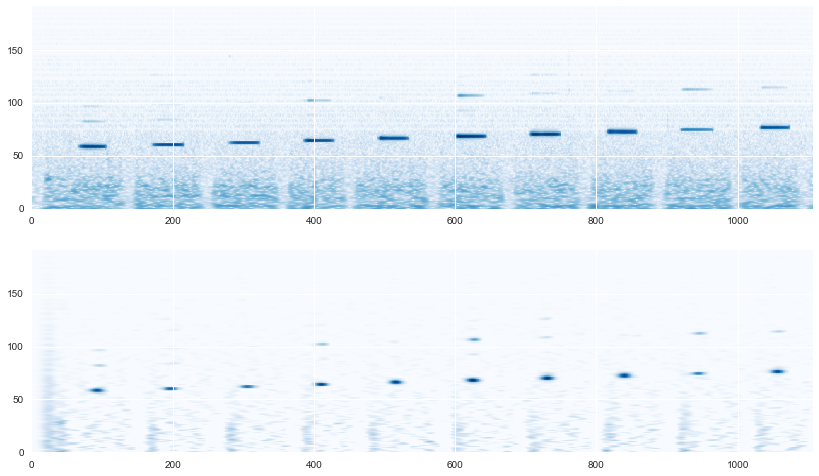

In [16]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, 8))
axes[0].imshow(lcqt, 
               interpolation='nearest', aspect='auto', 
               origin='lower', cmap=plt.cm.Blues)

c_n = canny(51, 3.5, 1)
os = sig.lfilter(c_n, np.ones(1), lcqt, axis=1)
axes[1].imshow(os * (os > 0),
               interpolation='nearest', aspect='auto', 
               origin='lower', cmap=plt.cm.Blues)


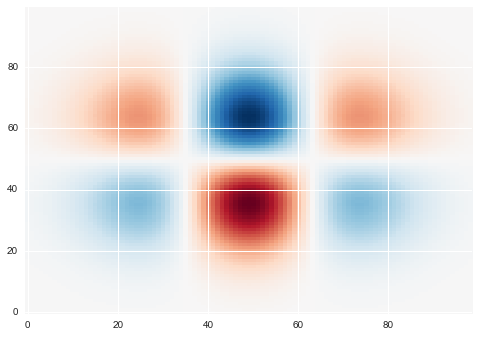

In [22]:
c_n = canny(100, 3.5, 1).reshape(-1, 1)
c_n2 = c_n * np.diff(c_n, axis=0).T
plt.imshow(c_n2, interpolation='nearest', aspect='auto', 
               origin='lower', cmap=plt.cm.RdBu)

In [25]:
wtf = sig.convolve2d(lcqt, c_n2.T, mode='same')

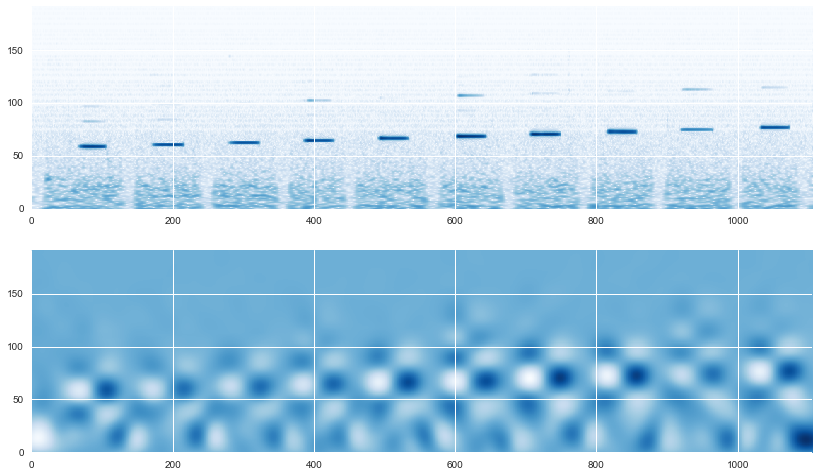

In [26]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, 8))
axes[0].imshow(lcqt, 
               interpolation='nearest', aspect='auto', 
               origin='lower', cmap=plt.cm.Blues)

axes[1].imshow(wtf,
               interpolation='nearest', aspect='auto', 
               origin='lower', cmap=plt.cm.Blues)



In [136]:
def hll_one(audiofile):
    tempfile = 'temp.wav'
    claudio.sox.convert(audiofile, tempfile, samplerate=44100, channels=1, bytedepth=2)
    output_csv = 'output.csv'
    if os.path.exists(output_csv):
        os.remove(output_csv)
    args = ['/Users/ejhumphrey/hll/hll_mono', tempfile, 
            output_csv, '/Users/ejhumphrey/hll/HLL_MONO_PARAMS.csv']
    subprocess.check_output(args)
    return pandas.read_csv(output_csv, header=0)

In [110]:
classmap = tax.InstrumentClassMap()
dset = res[res["instrument"].isin(classmap.allnames)]

In [111]:
filename = dset[dset.instrument == "Flute"].iloc[1].audio_file
print(filename, dset.shape)

/Volumes/camel/instruments/uiowa/theremin.music.uiowa.edu/sound files/MIS/Woodwinds/flute/Flute.nonvib.ff.C5B5.aiff (441, 5)


In [105]:
data = np.asarray(hll(filename)).T
trange = data[0]/44100.
nidx = data[2] > 0.999
data[1, nidx] = 0
data[2, nidx] = 0

/Volumes/camel/instruments/uiowa/theremin.music.uiowa.edu/sound files/MIS/Brass/frenchhorn/Horn.mf.C2B2.aiff
4.10658090286 3.67223671427


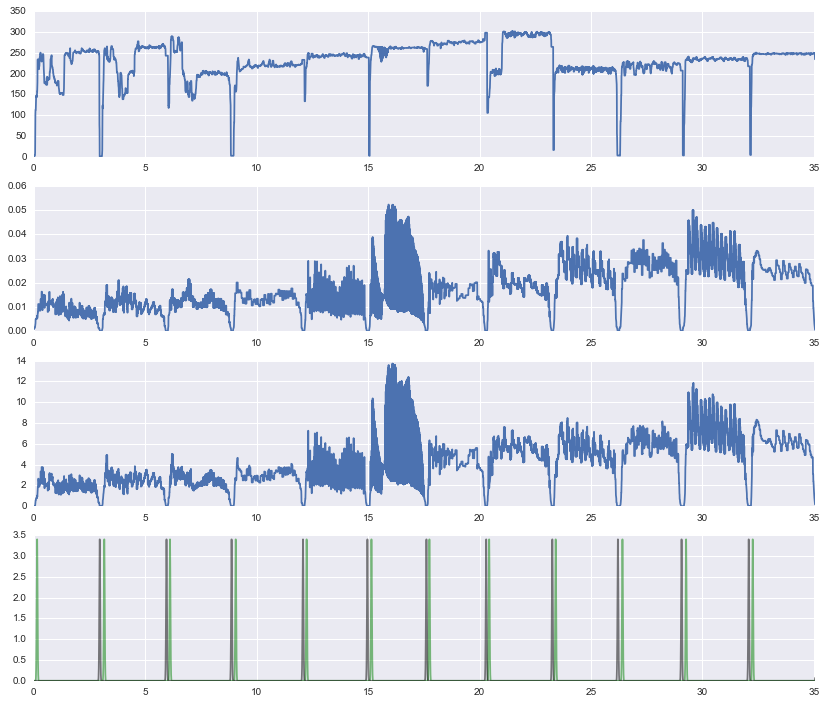

In [146]:
filename = dset.iloc[30].audio_file
print(filename)
time_points, freqs, amps = hll.hll(filename)

freqs = sig.medfilt(freqs, 11)
amps = sig.medfilt(amps, 11)

fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(14, 12))
axes[0].plot(time_points, freqs)
axes[1].plot(time_points, amps)
voicing = amps*freqs
print(voicing.mean(), np.median(voicing))
axes[2].plot(time_points, voicing)
c_n = canny(25, 3.5, 1)
onsets = sig.lfilter(c_n, [1], voicing > .5)
axes[3].plot(time_points, onsets * (onsets > 0), 
             'green', alpha=0.5)
axes[3].plot(time_points, -onsets * (onsets < 0), 
             'black', alpha=0.5)

for ax in axes:
    ax.set_xlim(0, time_points.max())

/Volumes/camel/instruments/uiowa/theremin.music.uiowa.edu/sound files/MIS/Piano_Other/guitar/Guitar.mf.sulD.C4Ab4.stereo.aif


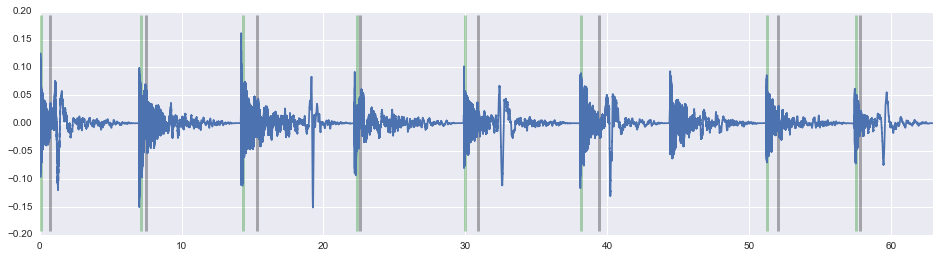

In [135]:
filename = dset.iloc[100].audio_file
print(filename)
x, fs = claudio.read(filename, samplerate=8000, 
                     channels=1, bytedepth=2)
trange = np.arange(len(x)) / fs

onsets, offsets = hll.segment_one(
    filename, mfilt_len=51, threshold=0.15, 
    delta=0.01, wait=500)

x_max = 1.2 * np.abs(x).max()

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16, 4))
ax.plot(trange, x.flatten())
ax.vlines(onsets, ymin=-x_max, ymax=x_max, 
          alpha=0.3, linewidth=3, colors='green')
ax.vlines(offsets, ymin=-x_max, ymax=x_max, 
          alpha=0.3, linewidth=3, colors='black')
ax.set_xlim(0, trange.max());

In [4]:
res.loc['uiowa16a92810']

audio_file    /Volumes/SHUTTLE/uiowa/theremin.music.uiowa.ed...
dataset                                                   uiowa
dynamic                                                      ff
instrument                                               BbClar
note                                                       C4B4
Name: uiowa16a92810, dtype: object

[  2.3084   7.229   12.263   17.161   22.0862  27.22    32.1451  37.0159
  42.0771  47.0567  52.0227  57.0023]


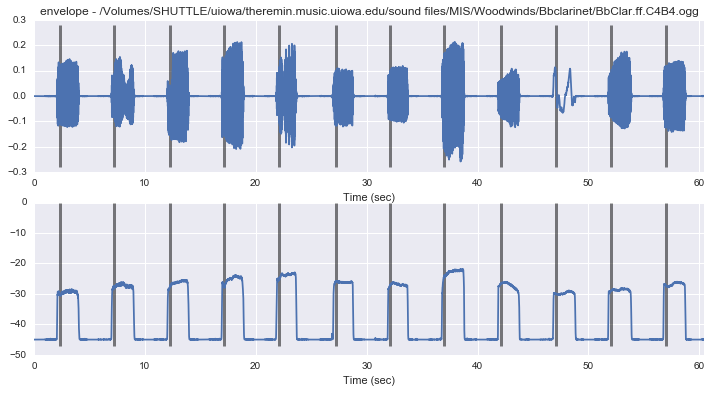

In [7]:
onsets, fig = S.segment(res.loc['uiowa16a92810'].audio_file, 'envelope')

In [5]:
onsets

,env_delta,env_max,env_mean,env_std,time
0,16.446086,-28.553914,-29.592884,0.506350,2.101406
1,18.937986,-26.062014,-27.326012,0.725745,7.024036
2,19.099639,-25.900361,-26.935300,1.015016,12.056961
3,20.696745,-24.303255,-25.949579,1.199132,16.944762
4,21.852087,-23.147913,-24.410671,1.251316,21.867392
5,19.282186,-25.717814,-26.471626,1.389963,26.981587
6,18.867614,-26.132386,-26.857720,0.631446,31.933243
7,22.776237,-22.223763,-23.750676,1.550207,36.797823
8,18.912525,-26.087475,-26.557465,0.374487,41.882993
9,15.340151,-29.659849,-30.883861,3.145894,46.770794


In [8]:
res.shape

(396, 5)

In [15]:
res[:5].to_json("/Users/ejhumphrey/Desktop/test_index.json")

In [13]:
res[:40].index.tolist()

['uiowa62f2c12e',
 'uiowa3a8b449a',
 'uiowa8badfaf2',
 'uiowad460f5c0',
 'uiowad0838a7c',
 'uiowa4d8ec892',
 'uiowacf1a4c9d',
 'uiowab7f92c44',
 'uiowa6bc4437f',
 'uiowa8bba2cda',
 'uiowa401f4375',
 'uiowa85c5d32e',
 'uiowad868f0f9',
 'uiowac1dd6a0f',
 'uiowa5fd0b226',
 'uiowa382a35e1',
 'uiowa1506911d',
 'uiowa8c637e25',
 'uiowaa09ff68a',
 'uiowa1dd2957f',
 'uiowa5fc8e20c',
 'uiowa9717c458',
 'uiowad5b15ab3',
 'uiowa2fc1b5bf',
 'uiowa61d53076',
 'uiowa424ba4cf',
 'uiowa4fd37375',
 'uiowa6306dda7',
 'uiowaf0b2dc83',
 'uiowa7dfaf5dc',
 'uiowa97361c3f',
 'uiowabe534957',
 'uiowabfc3c077',
 'uiowa222ae6de',
 'uiowa392d45ce',
 'uiowab571d951',
 'uiowaf8d31829',
 'uiowa76874b03',
 'uiowa720361c6',
 'uiowa9f10c86f']